In [2]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

## Defining the inputs for the run

In [3]:
# Set random seed for reproducibility

manualSeed = 999
# manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)


Random Seed:  999


## CelebA dataset for Faces

* img_align_celeba.zip: All the face images, cropped and aligned
* list_eval_partition.csv: Recommended partitioning of images into training, validation, testing sets. Images 1-162770 are training, 162771-182637 are validation, 182638-202599 are testing
* list_bbox_celeba.csv: Bounding box information for each image. "x_1" and "y_1" represent the upper left point coordinate of bounding box. "width" and "height" represent the width and height of bounding box
* list_landmarks_align_celeba.csv: Image landmarks and their respective coordinates. There are 5 landmarks: left eye, right eye, nose, left mouth, right mouth
* list_attr_celeba.csv: Attribute labels for each image. There are 40 attributes. "1" represents positive while "-1" represents negative


## Setting the hyper-parameters

In [4]:
# Root directory for dataset
dataroot = "celeba-dataset/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
# size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
n_channels = 3

# Size of z latent vector (i.e. size of generator input)
n_z = 100

# Size of feature maps in generator
n_gen_fmap = 64

# Size of feature maps in discriminator
n_disc_fmap = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
n_gpu = 1

## Loading the data

In [5]:
# We can use an image folder dataset the way we have it setup.

# Create the dataset

dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
''' Normalize does the following for each channel:

    image = (image - mean) / std

    The parameters mean, std are passed as 0.5, 0.5 in your case. This will normalize the image in the range [-1,1]. For example, the minimum value 0 will be converted to (0-0.5)/0.5=-1, the maximum value of 1 will be converted to (1-0.5)/0.5=1.

    if you would like to get your image back in [0,1] range, you could use,

    image = ((image * std) + mean)

    About whether it helps CNN to learn better, I’m not sure. But majority of the papers I read employ some normalization schema. What you are following is one of them.

    Hope it helps. '''

# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

print(dataset)

Dataset ImageFolder
    Number of datapoints: 202599
    Root location: celeba-dataset/
    StandardTransform
Transform: Compose(
               Resize(size=64, interpolation=PIL.Image.BILINEAR)
               CenterCrop(size=(64, 64))
               ToTensor()
               Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
           )


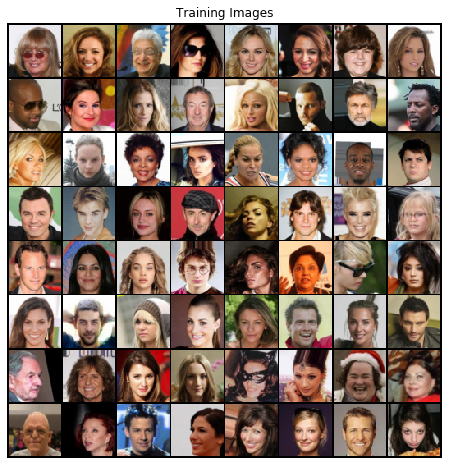

In [6]:
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and n_gpu > 0) else "cpu")
# print(device)
# Plot some training images
# print(next(iter(dataloader)))
real_batch = next(iter(dataloader))
# print(real_batch)
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

## Weight initialization

In [7]:
# custom weights initialization called on netG and netD
# All model weights shall be randomly initialized from a Normal distribution with mean=0, stdev=0.02. 

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## Building the Generator

In [8]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, n_gpu):
        super(Generator, self).__init__()
        self.n_gpu = n_gpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( n_z, n_gen_fmap * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(n_gen_fmap * 8),
            nn.ReLU(True),
            # state size. (n_gen_fmap*8) x 4 x 4
            nn.ConvTranspose2d(n_gen_fmap * 8, n_gen_fmap * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_gen_fmap * 4),
            nn.ReLU(True),
            # state size. (n_gen_fmap*4) x 8 x 8
            nn.ConvTranspose2d( n_gen_fmap * 4, n_gen_fmap * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_gen_fmap * 2),
            nn.ReLU(True),
            # state size. (n_gen_fmap*2) x 16 x 16
            nn.ConvTranspose2d( n_gen_fmap * 2, n_gen_fmap, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_gen_fmap),
            nn.ReLU(True),
            # state size. (n_gen_fmap) x 32 x 32
            nn.ConvTranspose2d( n_gen_fmap, n_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

    
    
    
# Create the generator

net_G = Generator(n_gpu).to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.

net_G.apply(weights_init)

# Print the model
print(net_G)



Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


## Building the Discriminator

In [9]:
class Discriminator(nn.Module):
    def __init__(self, n_gpu):
        super(Discriminator, self).__init__()
        self.n_gpu = n_gpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(n_channels, n_disc_fmap, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (n_disc_fmap) x 32 x 32
            nn.Conv2d(n_disc_fmap, n_disc_fmap * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_disc_fmap * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (n_disc_fmap*2) x 16 x 16
            nn.Conv2d(n_disc_fmap * 2, n_disc_fmap * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_disc_fmap * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (n_disc_fmap*4) x 8 x 8
            nn.Conv2d(n_disc_fmap * 4, n_disc_fmap * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_disc_fmap * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (n_disc_fmap*8) x 4 x 4
            nn.Conv2d(n_disc_fmap * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)
    
# Create the Discriminator
net_D = Discriminator(n_gpu).to(device)

# # Handle multi-gpu if desired
# if (device.type == 'cuda') and (ngpu > 1):
#     netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
net_D.apply(weights_init)

# Print the model
print(net_D)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


## Learning through Loss functions and Optimizers

In [10]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
# the progression of the generator's learning drawn from a Gaussian distribution

#  In the training loop, we will periodically input this fixed_noise into G, and over the iterations we will see images form out of the noise.

fixed_noise = torch.randn(64, n_z, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizer_D = optim.Adam(net_D.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_G = optim.Adam(net_G.parameters(), lr=lr, betas=(beta1, 0.999))

print(optimizer_G)
print(optimizer_D)


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.5, 0.999)
    eps: 1e-08
    lr: 0.0002
    weight_decay: 0
)
Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.5, 0.999)
    eps: 1e-08
    lr: 0.0002
    weight_decay: 0
)


# Training 
## Part 1-Train the Discriminator

The goal of training the discriminator is to maximize the probability of correctly classifying a given input as fake or real. In terms of Goodfellow, we wish to “update the discriminator by ascending its stochastic gradient”. We want to maximize log(D(x))+log(1 - D(G(z))). Due to separate mini-batch suggestion from ganhacks, we use two parts for training. 

* First step: We will construct a batch of real samples from the training set, forward pass through D, calculate the loss (log(D(x))), then calculate the gradients in a backward pass. 

* Second step: We will construct a batch of fake samples with the current generator, forward pass this batch through D, calculate the loss (log(1−D(G(z)))), and accumulate the gradients with a backward pass. 

After accumulating the gradients from both all-real and all-fake batches, we call a step of the Discriminator's optimizer.

Important link: 
https://stackoverflow.com/questions/46944629/why-detach-needs-to-be-called-on-variable-in-this-example/47017303#47017303

## Part 2-Train the Generator

As stated in the original paper, we want to train the Generator by minimizing log(1−D(G(z))) in an effort to generate better fakes. As mentioned, this was shown by Goodfellow to not provide sufficient gradients, especially early in the learning process. As a fix, we instead wish to maximize log(D(G(z))). In the code we accomplish this by: classifying the Generator output from Part 1 with the Discriminator, computing G’s loss using real labels as GT, computing G’s gradients in a backward pass, and finally updating G’s parameters with an optimizer step. It may seem counter-intuitive to use the real labels as GT labels for the loss function, but this allows us to use the log(x) part of the BCELoss (rather than the log(1−x) part) which is exactly what we want.



In [26]:
# Here starts the training
img_list = []

G_losses = []
D_losses = []
iters = 0

print("Training starts : ........................")

# For each epoch

for epoch in range(num_epochs):
    
    # for each batch in the dataloader
    
    for i, data in enumerate(dataloader,0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        
        # Train with all-real batch
        
        net_D.zero_grad() # Sets gradients of all model parameters to zero.
        
        # Format batch 
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        
        
        # Forward pass real batch through D
        output = net_D(real_cpu).view(-1)
        
        # Calculate loss on all-real batch
        
        err_D_real = criterion(output, label)
        
        # Calculate gradients for D in backward pass
        
        err_D_real.backward()
        D_x = output.mean().item()
        
        # Train with all-fake batch images and their labels
        
        # Generate a batch of latent vectors
        
        noise = torch.randn(b_size, n_z, 1, 1, device=device)
        
        # Generate all-fake image batch with G
        
        fake = net_G(noise)
        label.fill_(fake_label)
        
        # Classifying all-fake batch with Discriminator D
        
        output = net_D(fake.detach()).view(-1)
        
        # Calculate D's loss on the all-fake batch
        
        err_D_fake = criterion(output, label)
        
        # Calculate the gradients for this batch
        
        err_D_fake.backward()
        D_G_z1 = output.mean().item()
        
        # Add the gradients from the all-real and all-fake batches
        
        err_D = err_D_real + err_D_fake
        
        # Update D
        
        optimizer_D.step()
        
        
        #########################################################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        
        net_G.zero_grad() # Sets gradients of all model parameters to zero.
        
        label.fill_(real_label)  # fake labels are real for generator cost
        
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = net_D(fake).view(-1)
        
        # Calculate G's loss based on this output
        err_G = criterion(output, label)
        
        # Calculate gradients for G
        err_G.backward()
        D_G_z2 = output.mean().item()
       
        # Update G
        optimizer_G.step()
        
        ## Output Training Stats
        
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f/%.4f' % (epoch, num_epochs, i, len(dataloader), err_D.item(), err_G.item(), D_x, D_G_z1, D_G_z2))
           
            
        # Save losses for plotting 
        
        G_losses.append(err_G.item())
        D_losses.append(err_D.item())
        
        # Checking the Generator and saving G's output on fixed noise
        
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = net_G(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

        
        
        
            

        
        
        
        
        
        
        
        
        
        
        
        
      
        
        
        
    



Training starts : ........................
[0/5][0/1583]	Loss_D: 1.7662	Loss_G: 6.7256	D(x): 0.7175	D(G(z)): 0.6777/0.0022
[0/5][50/1583]	Loss_D: 0.0146	Loss_G: 34.3250	D(x): 0.9898	D(G(z)): 0.0000/0.0000
[0/5][100/1583]	Loss_D: 0.8779	Loss_G: 8.6249	D(x): 0.6680	D(G(z)): 0.0007/0.0007
[0/5][150/1583]	Loss_D: 0.3714	Loss_G: 4.8873	D(x): 0.7786	D(G(z)): 0.0187/0.0158
[0/5][200/1583]	Loss_D: 0.8512	Loss_G: 6.3412	D(x): 0.9600	D(G(z)): 0.4744/0.0043
[0/5][250/1583]	Loss_D: 0.2094	Loss_G: 2.7546	D(x): 0.8847	D(G(z)): 0.0461/0.0939
[0/5][300/1583]	Loss_D: 0.3227	Loss_G: 3.7222	D(x): 0.8719	D(G(z)): 0.1353/0.0512
[0/5][350/1583]	Loss_D: 1.1171	Loss_G: 1.5165	D(x): 0.5297	D(G(z)): 0.1916/0.2730
[0/5][400/1583]	Loss_D: 0.4031	Loss_G: 3.8458	D(x): 0.7880	D(G(z)): 0.0682/0.0389
[0/5][450/1583]	Loss_D: 0.2873	Loss_G: 2.9184	D(x): 0.8632	D(G(z)): 0.0864/0.0829
[0/5][500/1583]	Loss_D: 1.4495	Loss_G: 3.2448	D(x): 0.4415	D(G(z)): 0.0088/0.0743
[0/5][550/1583]	Loss_D: 0.7612	Loss_G: 8.2977	D(x): 0.960

[3/5][200/1583]	Loss_D: 0.7038	Loss_G: 2.1674	D(x): 0.7390	D(G(z)): 0.2678/0.1525
[3/5][250/1583]	Loss_D: 0.8421	Loss_G: 3.0070	D(x): 0.8715	D(G(z)): 0.4589/0.0667
[3/5][300/1583]	Loss_D: 0.6291	Loss_G: 2.2399	D(x): 0.7833	D(G(z)): 0.2823/0.1302
[3/5][350/1583]	Loss_D: 0.6220	Loss_G: 1.9342	D(x): 0.6433	D(G(z)): 0.1231/0.1815
[3/5][400/1583]	Loss_D: 0.6892	Loss_G: 3.8383	D(x): 0.8363	D(G(z)): 0.3562/0.0319
[3/5][450/1583]	Loss_D: 0.6021	Loss_G: 3.0204	D(x): 0.8643	D(G(z)): 0.3308/0.0681
[3/5][500/1583]	Loss_D: 0.7088	Loss_G: 3.6146	D(x): 0.9009	D(G(z)): 0.4078/0.0377
[3/5][550/1583]	Loss_D: 0.8430	Loss_G: 2.0422	D(x): 0.5145	D(G(z)): 0.0402/0.1847
[3/5][600/1583]	Loss_D: 0.6013	Loss_G: 2.1776	D(x): 0.7172	D(G(z)): 0.1952/0.1421
[3/5][650/1583]	Loss_D: 0.5744	Loss_G: 1.9116	D(x): 0.7132	D(G(z)): 0.1699/0.1788
[3/5][700/1583]	Loss_D: 2.1835	Loss_G: 0.3079	D(x): 0.1735	D(G(z)): 0.0409/0.7593
[3/5][750/1583]	Loss_D: 0.7003	Loss_G: 3.2879	D(x): 0.8618	D(G(z)): 0.3786/0.0508
[3/5][800/1583]	

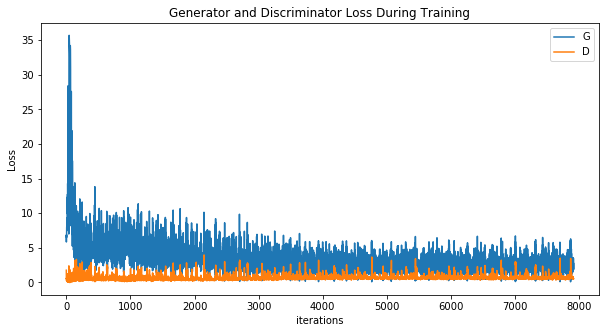

In [27]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

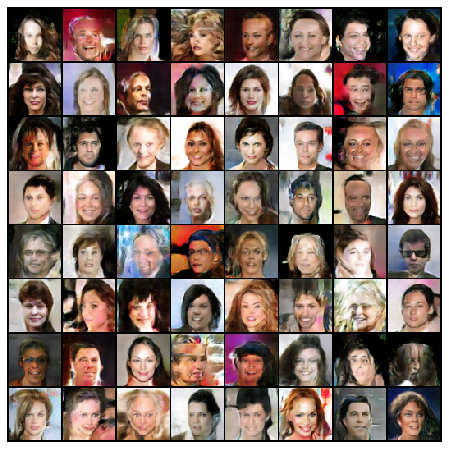

In [28]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

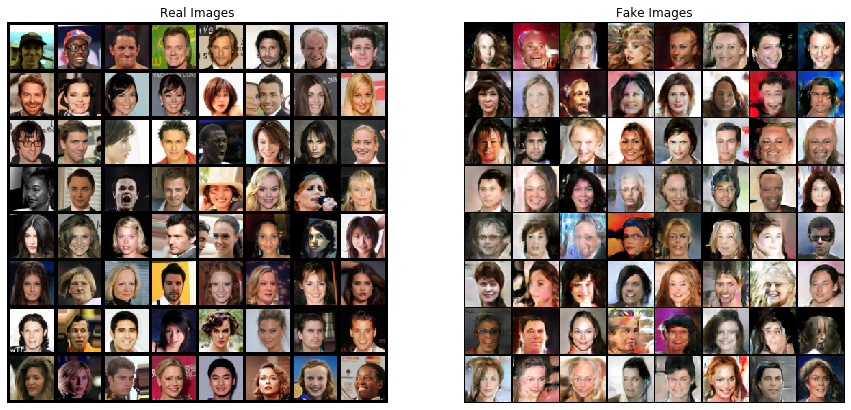

In [29]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()